In [1]:
import h2o
from h2o.automl import H2OAutoML
import pandas as pd

In [2]:
upstream = None
product = None
models_path = None
random_seed = None
target = None
factors = None
h2oautoml_config = None

In [3]:
# Parameters
target = ["WINNER"]
random_seed = 1
factors = [
    "TITLE_BOUT",
    "BANTAMWEIGHT",
    "CATCH WEIGHT",
    "FEATHERWEIGHT",
    "FLYWEIGHT",
    "HEAVYWEIGHT",
    "LIGHT HEAVYWEIGHT",
    "LIGHTWEIGHT",
    "MIDDLEWEIGHT",
    "WELTERWEIGHT",
    "WOMENS BANTAMWEIGHT",
    "WOMENS FEATHERWEIGHT",
    "WOMENS FLYWEIGHT",
    "WOMENS STRAWEIGHT",
]
h2oautoml_config = {
    "max_models": 2,
    "verbosity": "warn",
    "preprocessing": ["target_encoding"],
    "include_algos": ["GLM"],
}
models_path = "/home/m/repo/mma/products/models/h2o"
upstream = {
    "split-train-test": {
        "train": "/home/m/repo/mma/products/data/train.csv",
        "test": "/home/m/repo/mma/products/data/test.csv",
    }
}
product = {"nb": "/home/m/repo/mma/products/reports/fit_h2o_automl.ipynb"}


In [4]:
import pandas as pd
train_df = pd.read_csv(upstream['split-train-test']['train'])
test_df = pd.read_csv(upstream['split-train-test']['test'])

In [5]:
X_train = train_df.drop(columns = target)
Y_train = train_df[target]

In [6]:
X_test = test_df.drop(columns = target)
Y_test = test_df[target]

In [7]:
print(train_df.columns)

Index(['TITLE_BOUT', 'BANTAMWEIGHT', 'CATCH WEIGHT', 'FEATHERWEIGHT',
       'FLYWEIGHT', 'HEAVYWEIGHT', 'LIGHT HEAVYWEIGHT', 'LIGHTWEIGHT',
       'MIDDLEWEIGHT', 'WELTERWEIGHT',
       ...
       'B_OPP_BODY_ATT', 'B_OPP_LEG', 'B_OPP_LEG_ATT', 'B_OPP_DISTANCE',
       'B_OPP_DISTANCE_ATT', 'B_OPP_CLINCH', 'B_OPP_CLINCH_ATT',
       'B_OPP_GROUND', 'B_OPP_GROUND_ATT', 'WINNER'],
      dtype='object', length=115)


In [8]:
# Start the H2O cluster (locally)
h2o.init()
print(h2o.estimators.xgboost.H2OXGBoostEstimator.available())
train_hf = h2o.H2OFrame(train_df)
test_hf = h2o.H2OFrame(test_df)

Checking whether there is an H2O instance running at http://localhost:54321 .

 connected.


H2O_cluster_uptime:,23 mins 52 secs
H2O_cluster_timezone:,Etc/GMT
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.2
H2O_cluster_version_age:,13 days
H2O_cluster_name:,root
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.422 Gb
H2O_cluster_total_cores:,1
H2O_cluster_allowed_cores:,1
H2O_cluster_status:,"locked, healthy"


True


Parse progress: |

████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |

████████████████████████████████████████████████████████████████| (done) 100%


In [9]:
train_hf[factors] = train_hf[factors].asfactor()
test_hf[factors] = test_hf[factors].asfactor()

In [10]:
train_hf[target] = train_hf[target].asfactor()
test_hf[target] = test_hf[target].asfactor()

In [11]:
print(train_hf.describe())

Rows:2502
Cols:115




,TITLE_BOUT,BANTAMWEIGHT,CATCH WEIGHT,FEATHERWEIGHT,FLYWEIGHT,HEAVYWEIGHT,LIGHT HEAVYWEIGHT,LIGHTWEIGHT,MIDDLEWEIGHT,WELTERWEIGHT,WOMENS BANTAMWEIGHT,WOMENS FEATHERWEIGHT,WOMENS FLYWEIGHT,WOMENS STRAWEIGHT,R_AGE,R_HEIGHT,R_REACH,R_WIN_PCT,R_WIN_STREAK,R_LOSS_STREAK,R_KD,R_SIG_STR,R_SIG_STR_ATT,R_TOTAL_STR,R_TOTAL_STR_ATT,R_TD,R_TD_ATT,R_SUB_ATT,R_REV,R_CTRL,R_HEAD,R_HEAD_ATT,R_BODY,R_BODY_ATT,R_LEG,R_LEG_ATT,R_DISTANCE,R_DISTANCE_ATT,R_CLINCH,R_CLINCH_ATT,R_GROUND,R_GROUND_ATT,R_OPP_KD,R_OPP_SIG_STR,R_OPP_SIG_STR_ATT,R_OPP_TOTAL_STR,R_OPP_TOTAL_STR_ATT,R_OPP_TD,R_OPP_TD_ATT,R_OPP_SUB_ATT,R_OPP_REV,R_OPP_CTRL,R_OPP_HEAD,R_OPP_HEAD_ATT,R_OPP_BODY,R_OPP_BODY_ATT,R_OPP_LEG,R_OPP_LEG_ATT,R_OPP_DISTANCE,R_OPP_DISTANCE_ATT,R_OPP_CLINCH,R_OPP_CLINCH_ATT,R_OPP_GROUND,R_OPP_GROUND_ATT,B_AGE,B_HEIGHT,B_REACH,B_WIN_PCT,B_WIN_STREAK,B_LOSS_STREAK,B_KD,B_SIG_STR,B_SIG_STR_ATT,B_TOTAL_STR,B_TOTAL_STR_ATT,B_TD,B_TD_ATT,B_SUB_ATT,B_REV,B_CTRL,B_HEAD,B_HEAD_ATT,B_BODY,B_BODY_ATT,B_LEG,B_LEG_ATT,B_DISTANCE,B_DISTANCE_ATT,B_CLINCH,B_CLINCH_ATT,B_GROUND,B_GROUND_ATT,B_OPP_KD,B_OPP_SIG_STR,B_OPP_SIG_STR_ATT,B_OPP_TOTAL_STR,B_OPP_TOTAL_STR_ATT,B_OPP_TD,B_OPP_TD_ATT,B_OPP_SUB_ATT,B_OPP_REV,B_OPP_CTRL,B_OPP_HEAD,B_OPP_HEAD_ATT,B_OPP_BODY,B_OPP_BODY_ATT,B_OPP_LEG,B_OPP_LEG_ATT,B_OPP_DISTANCE,B_OPP_DISTANCE_ATT,B_OPP_CLINCH,B_OPP_CLINCH_ATT,B_OPP_GROUND,B_OPP_GROUND_ATT,WINNER
type,enum,enum,enum,enum,enum,enum,enum,enum,enum,enum,enum,enum,enum,enum,int,real,real,real,int,int,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,int,real,real,real,int,int,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,enum
mins,,,,,,,,,,,,,,,19.0,152.4,152.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2521008403361344,0.0,0.5042016806722689,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,152.4,152.4,0.0,0.0,0.0,0.0,0.0,0.2521008403361344,0.0,0.5042016806722689,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,
mean,,,,,,,,,,,,,,,30.514788169464424,178.30727418065584,183.09828137489976,0.611219867387572,1.1726618705035952,0.6490807354116691,0.03544145851002402,3.4641788787459604,7.856171162658871,5.053453581795466,9.662267974130279,0.10861923063194563,0.27751754241657556,0.04504135758334949,0.011737749263826522,13.125949275779352,2.2647511396554516,6.194027528746454,0.6625212424572846,0.9822212278189651,0.5369064966332366,0.6799224060934654,2.3532738471157835,6.250760133661793,0.5181592981785789,0.7594553812691749,0.5927457334516035,0.8459556477278981,0.02574062502128556,3.2228944895283247,7.663022257101374,4.6894566218524085,9.321860984123509,0.09638048340656113,0.27337154726449703,0.03684948512758499,0.011425266548459009,11.603442002292224,2.071463758988887,6.040376747045853,0.6394585580151662,0.9644715183589643,0.5119721725242746,0.6581739916965439,2.2403966903979415,6.224200173862884,0.4932353466116878,0.7300877857782662,0.48926245251869493,0.7087342974602081,29.936450839328483,178.57517985611514,183.16678657074306,0.5782262355654851,1.089128697042365,0.5599520383693046,0.045603263476404025,3.537531843344968,8.053744882805915,5.147908273972282,9.884540036350112,0.10803780255218244,0.27640027089520186,0.05102548863367438,0.014108520674973821,12.896779982847505,2.3254242830070084,6.377979201754207,0.6834605615640125,1.0069295291464648,0.5286469987739438,0.6688361519052544,2.3688017993935464,6.361024600677297,0.5569708333488319,0.8120220929406159,0.6117592106025819,0.8806981891880127,0.030298716553152385,3.229851094201237,7.628285294448099,4.7

None


In [12]:
h2oautoml_config['seed'] = random_seed
automl = H2OAutoML(**h2oautoml_config)

In [13]:
aml = H2OAutoML()

In [14]:
aml.train(x=X_train.columns.to_list(), y=target[0], training_frame=train_hf)
# View the AutoML Leaderboard
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
print(lb.head())  # Print all rows instead of default (10 rows)
# The leader model is stored here
print(aml.leader)

AutoML progress: |

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█

█| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_7_AutoML_2_20220208_100431,0.627643,0.659833,0.679783,0.489907,0.483479,0.233751,1321,0.035414,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_2_20220208_100431,0.625341,0.65829,0.684908,0.469504,0.482968,0.233258,264,0.026486,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_2_20220208_100431,0.624347,0.659263,0.680845,0.481898,0.483371,0.233647,264,0.01056,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_2_20220208_100431,0.624006,0.660693,0.677389,0.487588,0.4839,0.23416,178,0.030803,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_2_20220208_100431,0.623918,0.659159,0.680234,0.493495,0.483318,0.233596,155,0.020155,StackedEnsemble
GLM_1_AutoML_2_20220208_100431,0.623877,0.660953,0.681414,0.491073,0.48409,0.234344,1156,0.003554,GLM
StackedEnsemble_BestOfFamily_2_AutoML_2_20220208_100431,0.62257,0.659765,0.679555,0.468223,0.483627,0.233895,154,0.02812,StackedEnsemble
StackedEnsemble_AllModels_4_AutoML_2_20220208_100431,0.621569,0.659971,0.681583,0.475054,0.483757,0.234021,757,0.093116,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_2_20220208_100431,0.620898,0.659935,0.682799,0.485383,0.483812,0.234075,283,0.034389,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_2_20220208_100431,0.620747,0.66014,0.681478,0.477718,0.483805,0.234068,589,0.069565,StackedEnsemble



Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_7_AutoML_2_20220208_100431

No model summary for this model

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.17569018965411112
RMSE: 0.41915413591435685
LogLoss: 0.5368095197387711
Null degrees of freedom: 2501
Residual degrees of freedom: 2496
Null deviance: 3418.821837411521
Residual deviance: 2686.1948367728105
AIC: 2698.1948367728105
AUC: 0.918004921692932
AUCPR: 0.9371656304105498
Gini: 0.836009843385864

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5401790764338031: 


,,0,1,Error,Rate
0,0,824.0,251.0,0.2335,(251.0/1075.0)
1,1,162.0,1265.0,0.1135,(162.0/1427.0)
2,Total,986.0,1516.0,0.1651,(413.0/2502.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.540179,0.859667,228.0
1,max f2,0.468842,0.912642,290.0
2,max f0point5,0.589911,0.880415,185.0
3,max accuracy,0.557527,0.836531,214.0
4,max precision,0.951165,1.000000,0.0
5,max recall,0.400266,1.000000,340.0
6,max specificity,0.951165,1.000000,0.0
7,max absolute_mcc,0.564987,0.669062,207.0
8,max min_per_class_accuracy,0.562343,0.831114,210.0
9,max mean_per_class_accuracy,0.564987,0.837055,207.0



Gains/Lift Table: Avg response rate: 57.03 %, avg score: 57.29 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010392,0.832251,1.753329,1.753329,1.000000,0.861059,1.000000,0.861059,0.018220,0.018220,75.332866,75.332866,0.018220
1,2,0.020384,0.804971,1.753329,1.753329,1.000000,0.815500,1.000000,0.838726,0.017519,0.035739,75.332866,75.332866,0.035739
2,3,0.030376,0.787044,1.753329,1.753329,1.000000,0.794201,1.000000,0.824080,0.017519,0.053259,75.332866,75.332866,0.053259
3,4,0.040368,0.775062,1.753329,1.753329,1.000000,0.781398,1.000000,0.813515,0.017519,0.070778,75.332866,75.332866,0.070778
4,5,0.050360,0.768192,1.753329,1.753329,1.000000,0.771392,1.000000,0.805157,0.017519,0.088297,75.332866,75.332866,0.088297
5,6,0.100320,0.729051,1.753329,1.753329,1.000000,0.745346,1.000000,0.775371,0.087596,0.175893,75.332866,75.332866,0.175893
6,7,0.150280,0.702416,1.711249,1.739339,0.976000,0.715873,0.992021,0.755591,0.085494,0.261388,71.124877,73.933934,0.258597
7,8,0.200240,0.681187,1.697222,1.728831,0.968000,0.691589,0.986028,0.739622,0.084793,0.346181,69.722214,72.883106,0.339669
8,9,0.300160,0.643593,1.599036,1.685624,0.912000,0.661982,0.961385,0.713777,0.159776,0.505957,59.903574,68.562356,0.478980
9,10,0.400080,0.611854,1.507863,1.641228,0.860000,0.628048,0.936064,0.692366,0.150666,0.656622,50.786265,64.122773,0.597087




ModelMetricsBinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.23375149352497585
RMSE: 0.4834785347096351
LogLoss: 0.6598326807098466
Null degrees of freedom: 2501
Residual degrees of freedom: 2496
Null deviance: 3419.200075058548
Residual deviance: 3301.802734272072
AIC: 3313.802734272072
AUC: 0.6276429654014766
AUCPR: 0.6797834912745148
Gini: 0.25528593080295314

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3832329898597151: 


,,0,1,Error,Rate
0,0,33.0,1042.0,0.9693,(1042.0/1075.0)
1,1,15.0,1412.0,0.0105,(15.0/1427.0)
2,Total,48.0,2454.0,0.4225,(1057.0/2502.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.383233,0.727648,372.0
1,max f2,0.243625,0.869062,399.0
2,max f0point5,0.521096,0.655901,258.0
3,max accuracy,0.519352,0.614708,260.0
4,max precision,0.955811,1.000000,0.0
5,max recall,0.243625,1.000000,399.0
6,max specificity,0.955811,1.000000,0.0
7,max absolute_mcc,0.571776,0.191110,194.0
8,max min_per_class_accuracy,0.567348,0.586545,198.0
9,max mean_per_class_accuracy,0.571776,0.596504,194.0



Gains/Lift Table: Avg response rate: 57.03 %, avg score: 57.02 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010392,0.782870,1.483586,1.483586,0.846154,0.826865,0.846154,0.826865,0.015417,0.015417,48.358579,48.358579,0.011696
1,2,0.020384,0.753331,1.262397,1.375160,0.720000,0.766285,0.784314,0.797169,0.012614,0.028031,26.239664,37.515973,0.017798
2,3,0.030376,0.738921,1.402663,1.384207,0.800000,0.745498,0.789474,0.780172,0.014015,0.042046,40.266293,38.420684,0.027163
3,4,0.040368,0.726772,1.683196,1.458214,0.960000,0.733153,0.831683,0.768534,0.016819,0.058865,68.319552,45.821394,0.043051
4,5,0.050360,0.717420,1.122130,1.391531,0.640000,0.723095,0.793651,0.759518,0.011212,0.070077,12.213034,39.153068,0.045891
5,6,0.100320,0.686516,1.220317,1.306265,0.696000,0.699756,0.745020,0.729756,0.060967,0.131044,22.031675,30.626478,0.071509
6,7,0.150280,0.664208,1.262397,1.291681,0.720000,0.675076,0.736702,0.711578,0.063069,0.194114,26.239664,29.168096,0.102021
7,8,0.200240,0.646243,1.234343,1.277375,0.704000,0.654384,0.728543,0.697308,0.061668,0.255781,23.434338,27.737517,0.129270
8,9,0.300160,0.620125,1.108104,1.221026,0.632000,0.632841,0.696405,0.675848,0.110722,0.366503,10.810371,22.102648,0.154410
9,10,0.400080,0.594333,1.136157,1.199830,0.648000,0.607092,0.684316,0.658676,0.113525,0.480028,13.615697,19.983030,0.186075


In [15]:
perf_train = aml.leader.model_performance(train_hf)
print("train accuracy")
perf_train.accuracy()

train accuracy


[[0.5575272544628267, 0.8365307753796962]]

In [16]:
perf_test = aml.leader.model_performance(test_hf)
print("test accuracy")
perf_test.accuracy()

test accuracy


[[0.5167224991634333, 0.6342925659472423]]

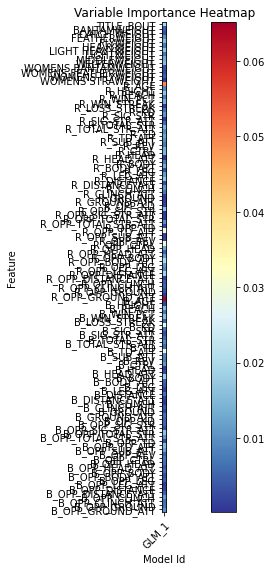

In [17]:
# or if some subset of the models is needed a slice of leaderboard can be used, e.g., using MAE as the sorting metric
va_plot = h2o.varimp_heatmap(aml.leaderboard.head(10))

In [18]:
print(va_plot)

or even extended leaderboard can be used
va_plot = h2o.varimp_heatmap(h2o.automl.get_leaderboard(aml, extra_columns="training_time_ms").sort("training_time_ms").head(10))

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_7_AutoML_2_20220208_100431


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5401790764338031: 


,,0,1,Error,Rate
0,0,824.0,251.0,0.2335,(251.0/1075.0)
1,1,162.0,1265.0,0.1135,(162.0/1427.0)
2,Total,986.0,1516.0,0.1651,(413.0/2502.0)


# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

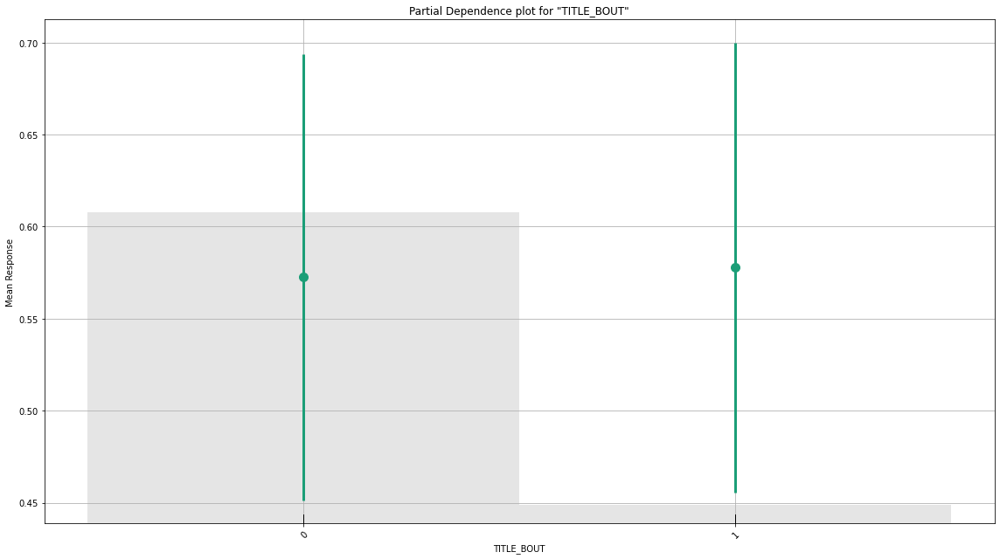

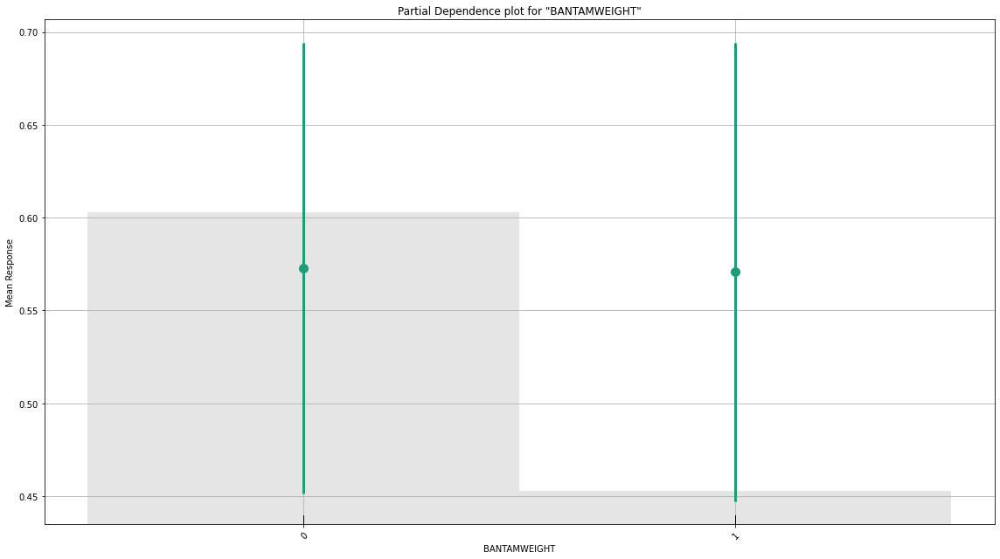

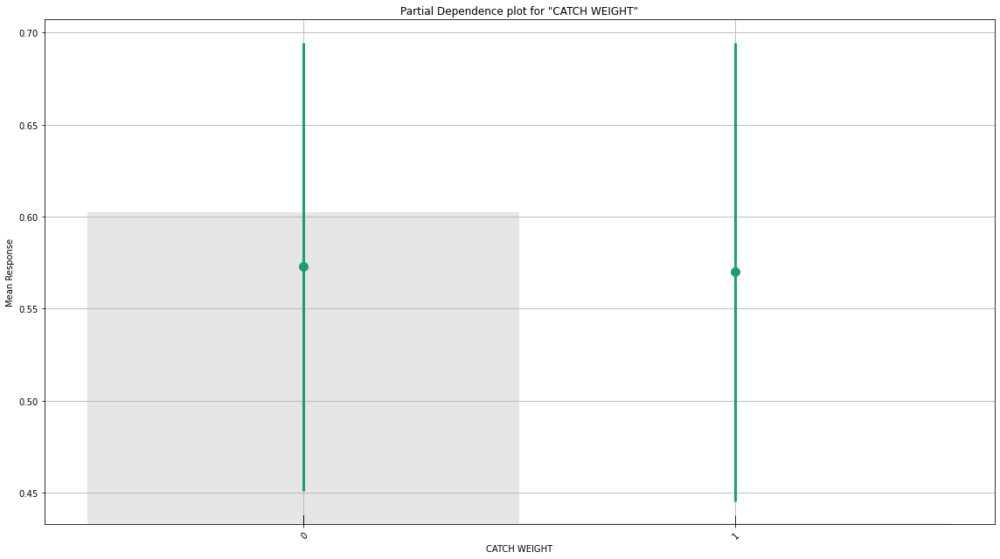

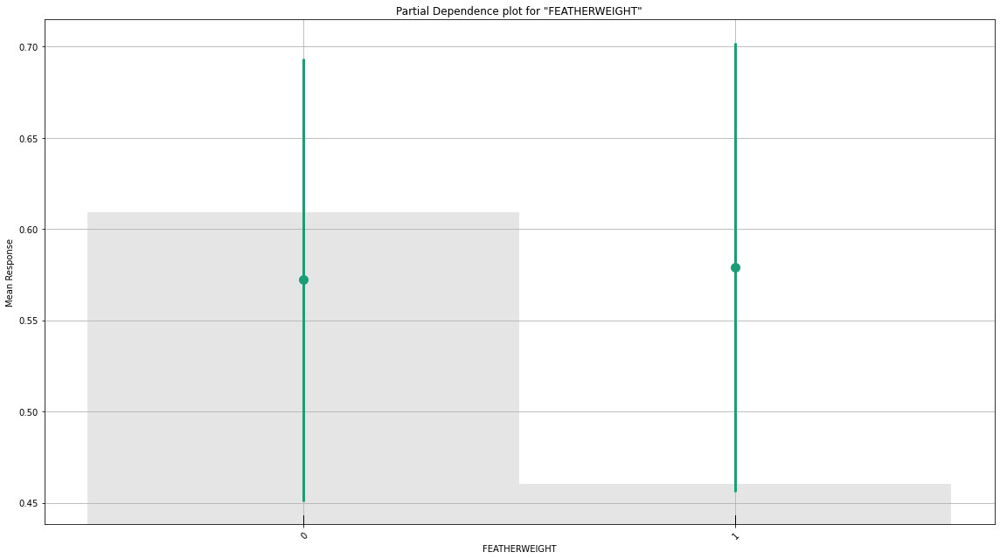

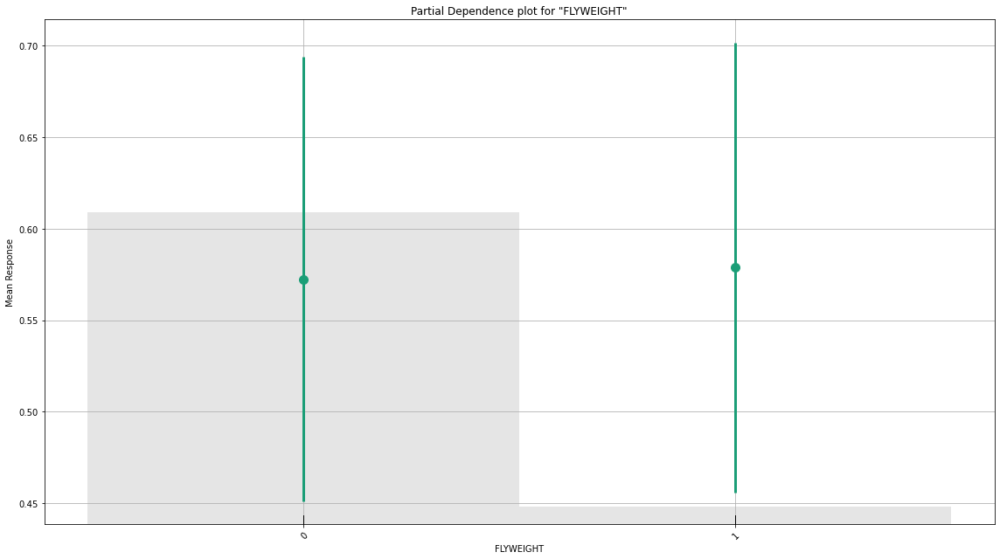

...

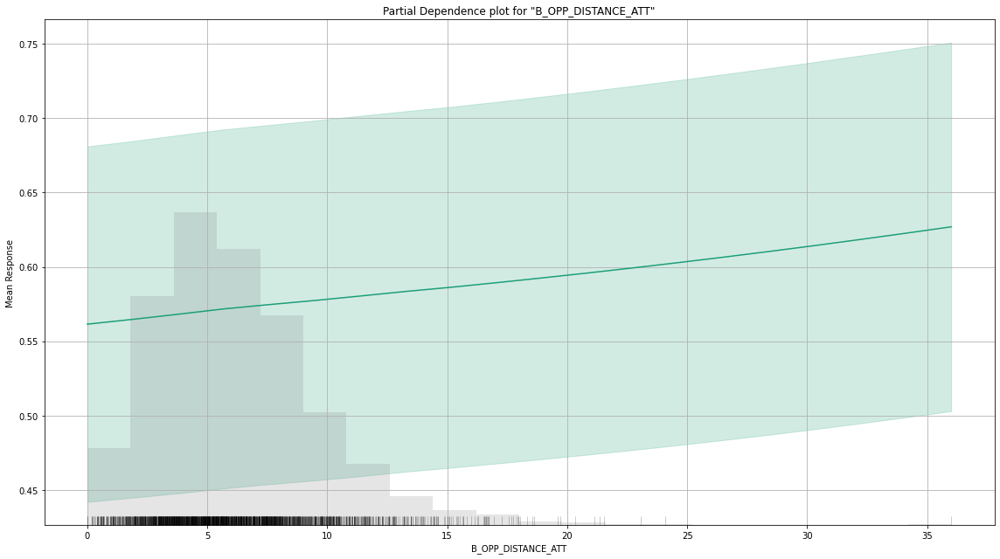

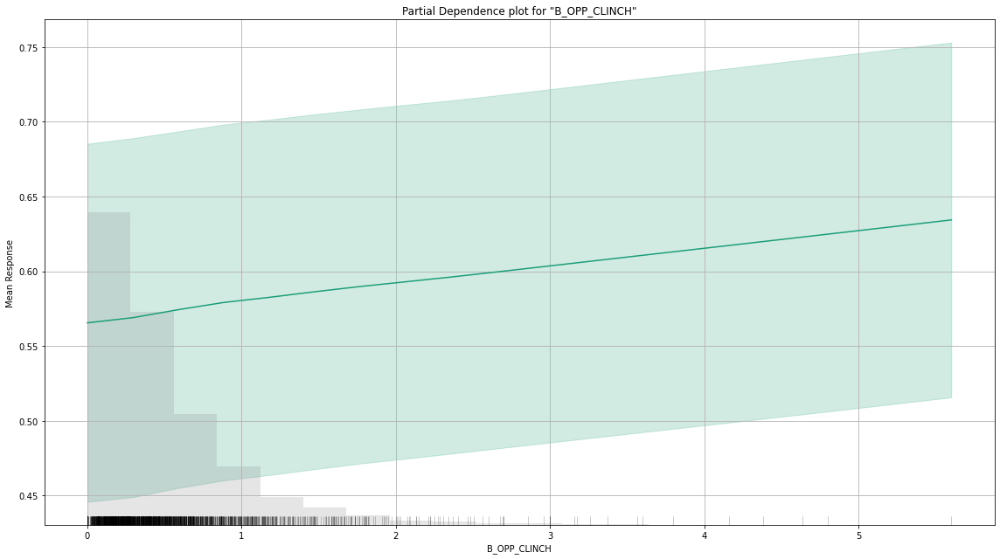

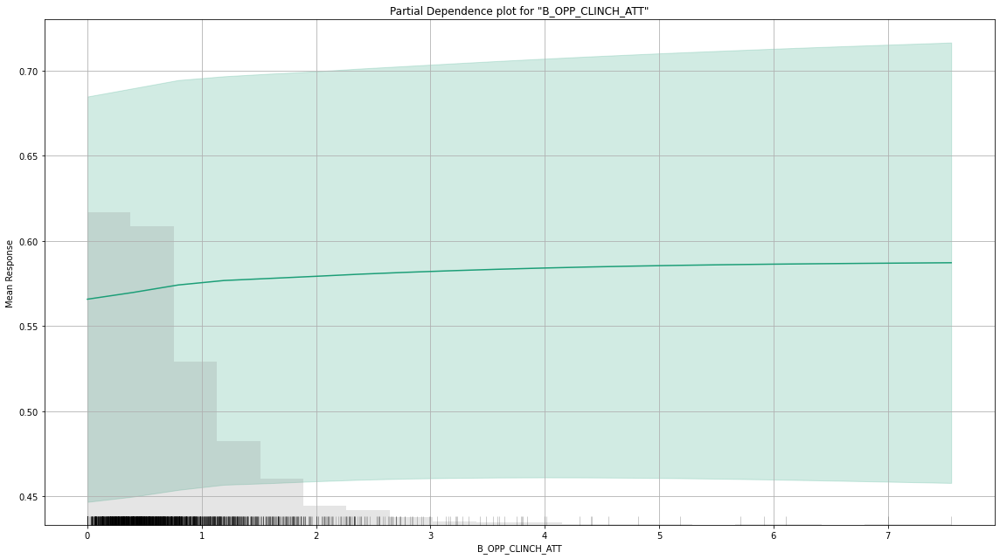

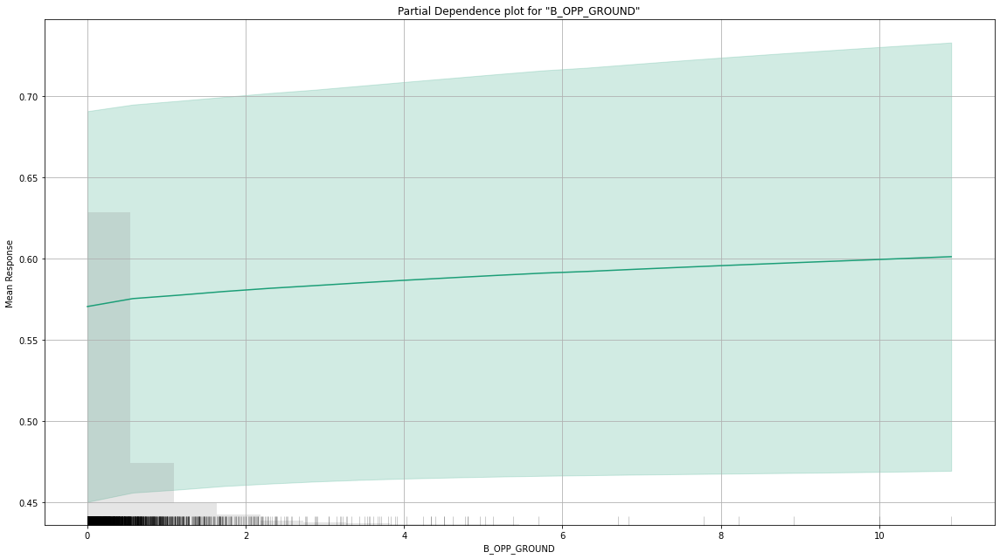

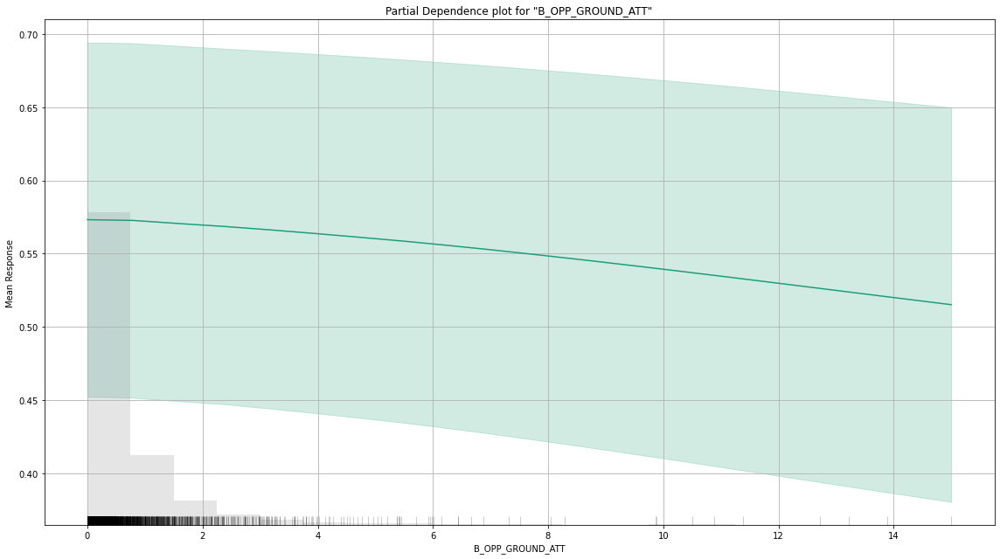

In [19]:
exa = aml.leader.explain(train_hf)

In [20]:

# # # Get model ids for all models in the AutoML Leaderboard
# model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
# # Get the "All Models" Stacked Ensemble model
# se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble" in mid][0])
# # Get the Stacked Ensemble metalearner model
# se

/home/m/miniconda3/envs/mma/lib/python3.8/site-packages/h2o/explanation/_explain.py:2799: UserWarning: No model with variable importance. Selecting all features to explain.
  warnings.warn("No model with variable importance. Selecting all features to explain.")


# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

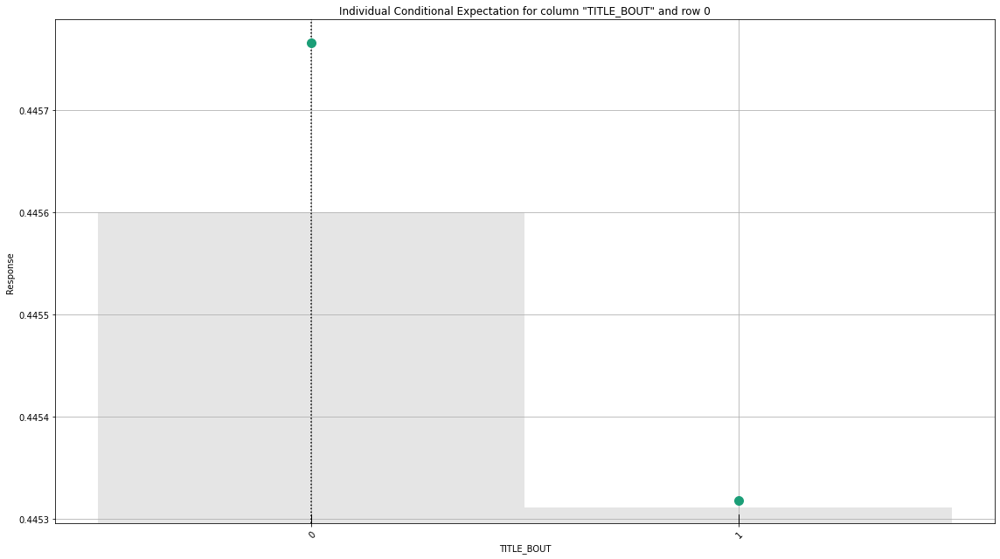

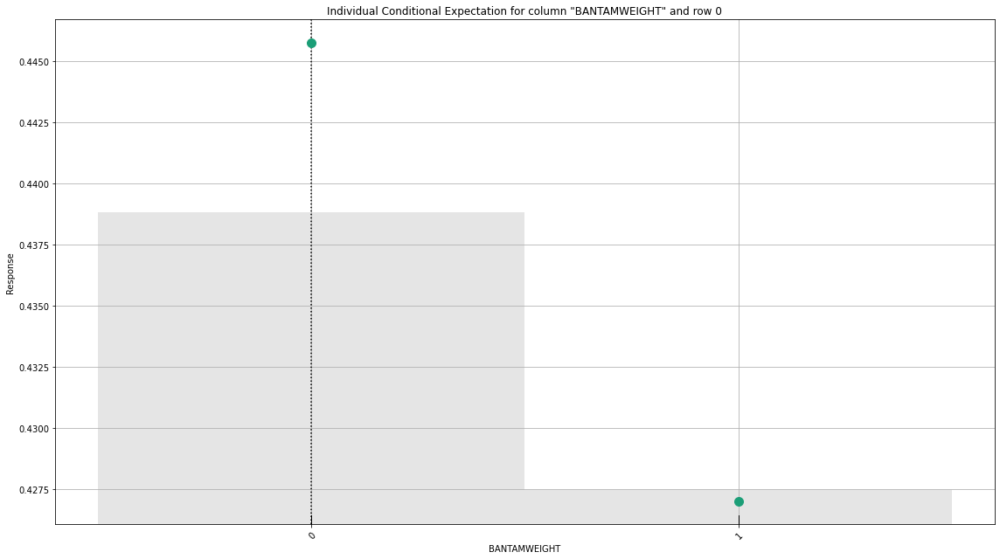

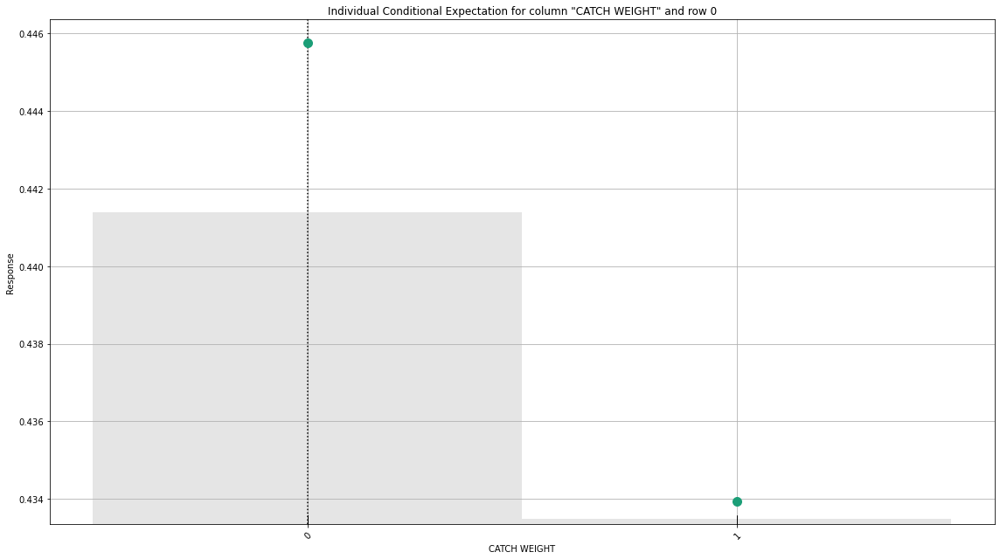

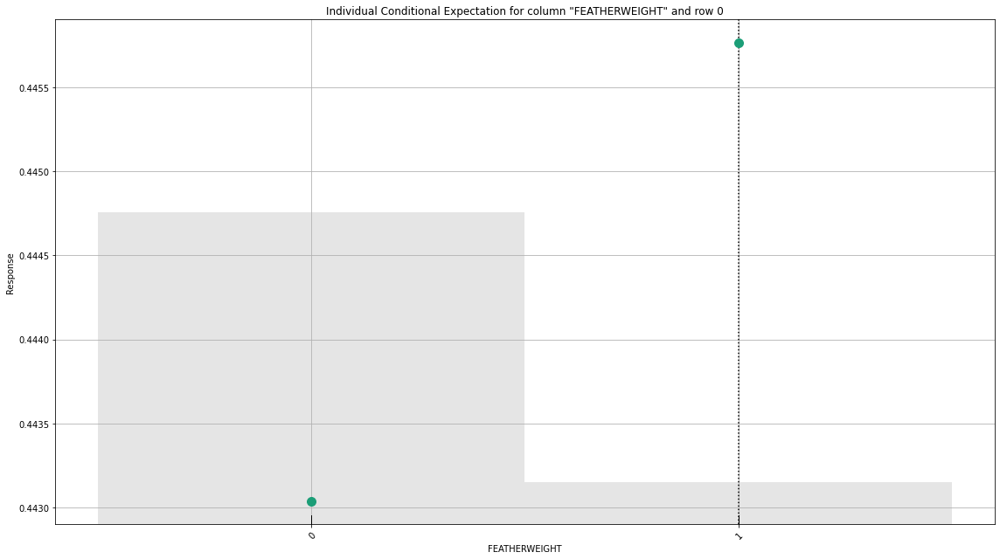

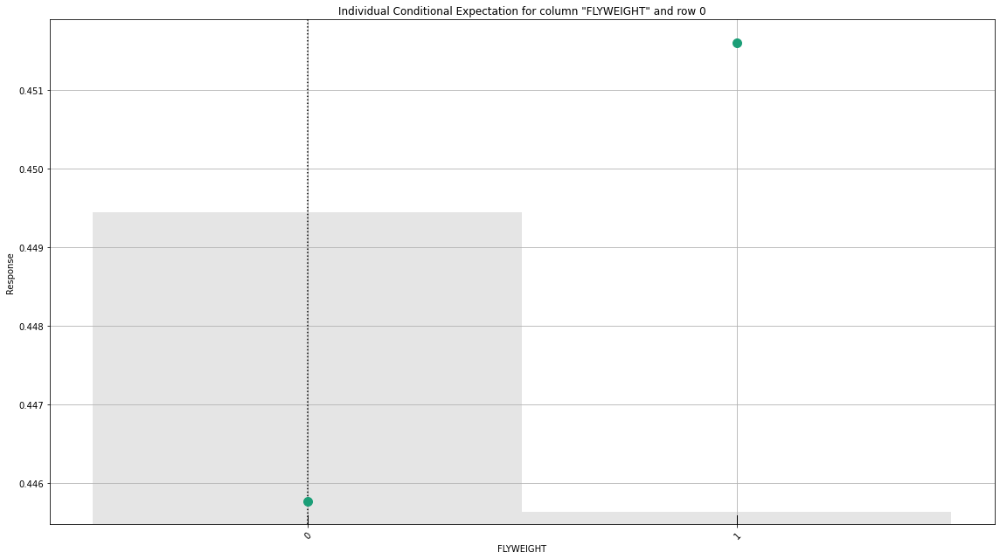

...

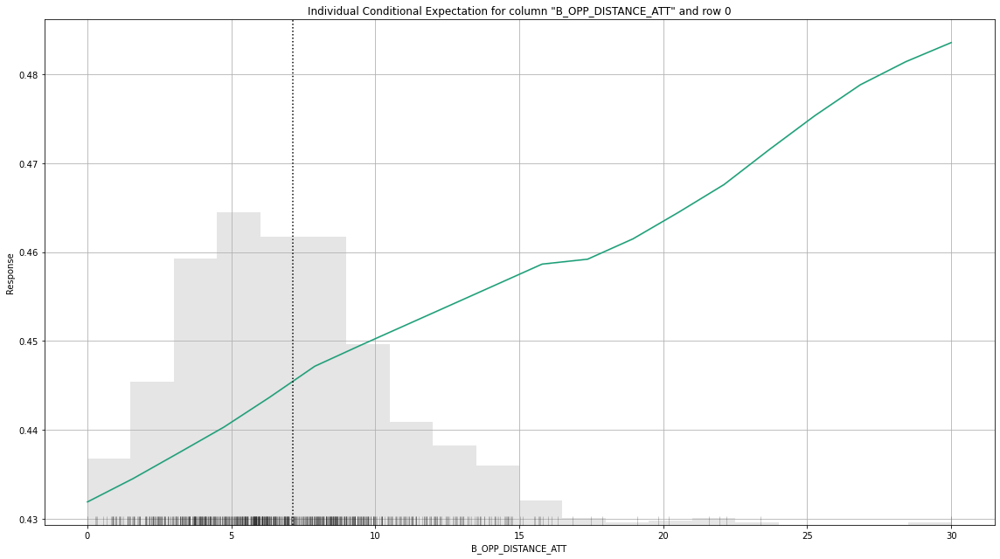

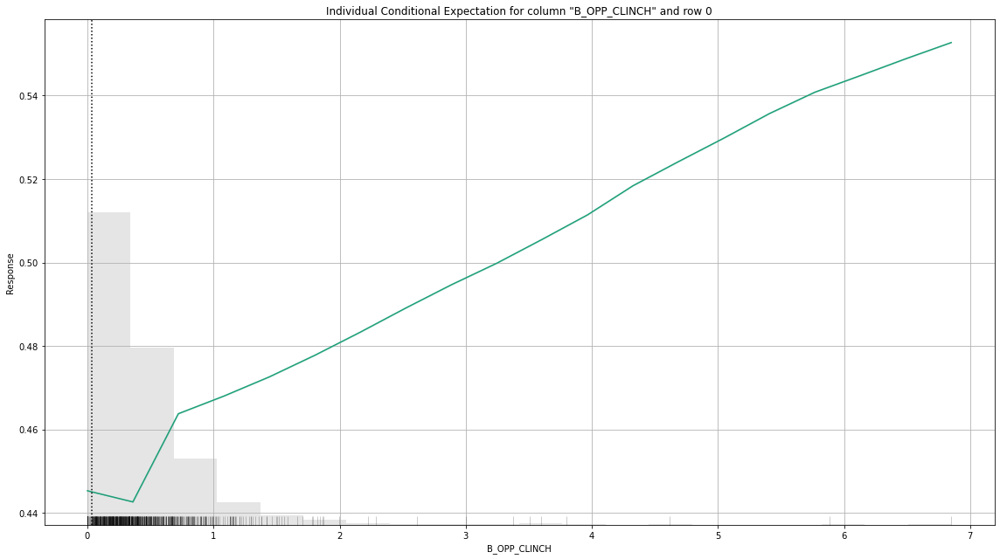

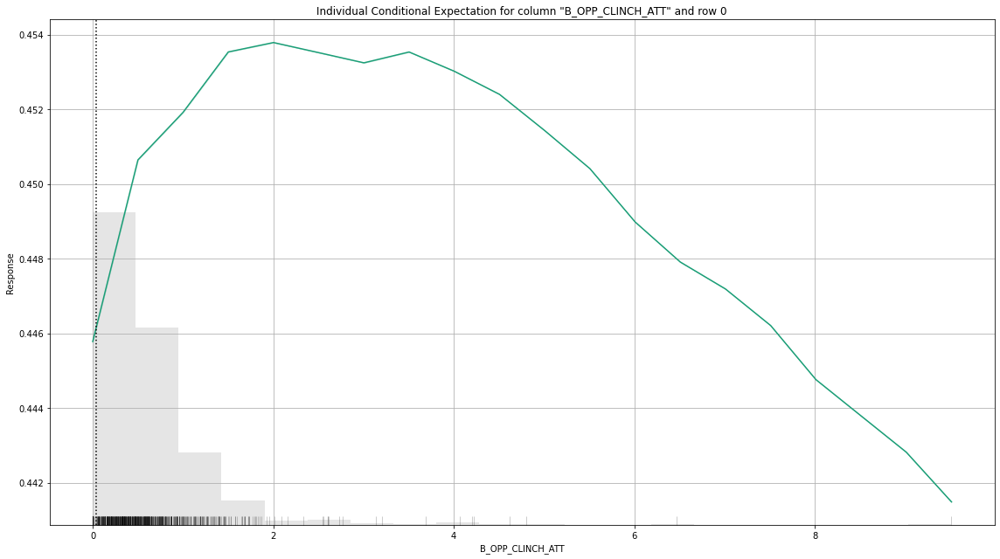

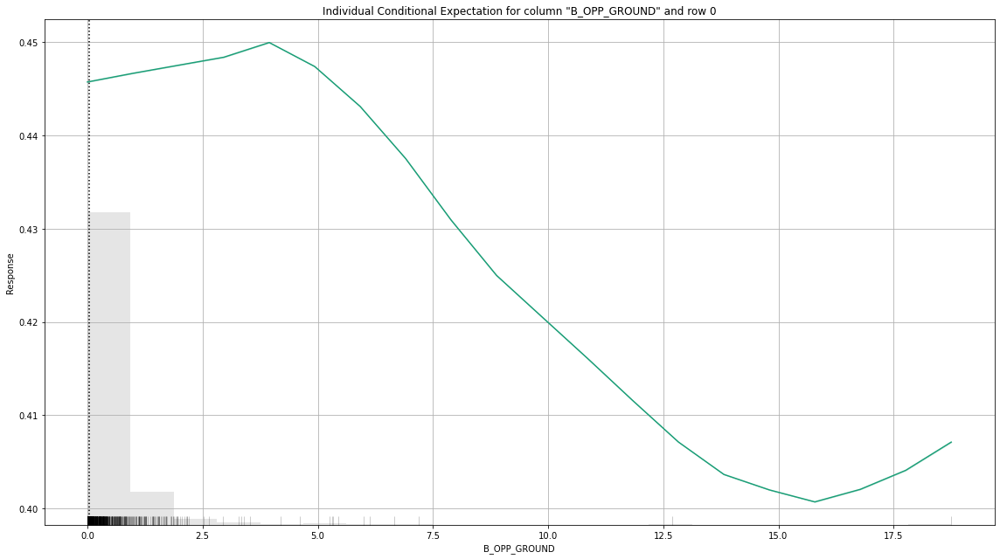

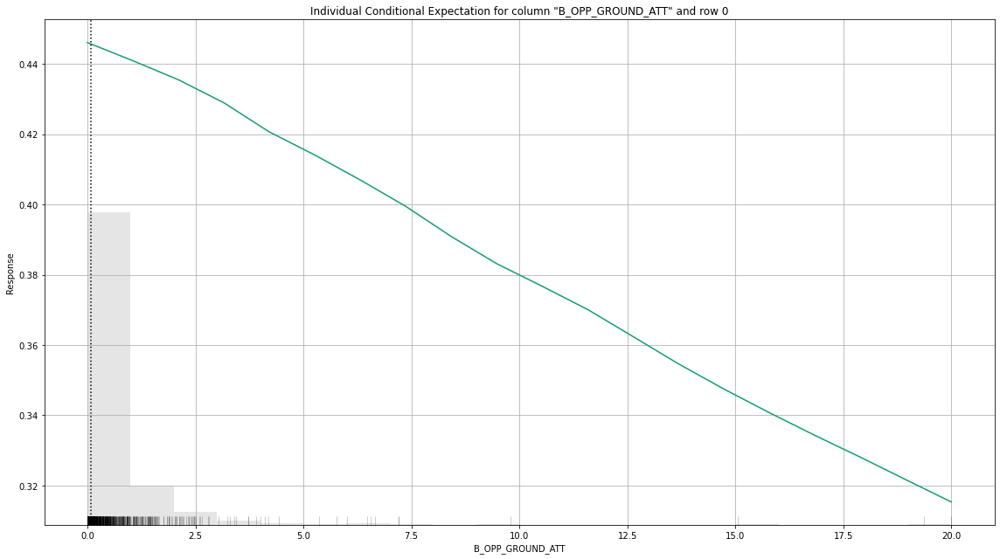



H2OExplanation([('ice', H2OExplanation([('header', <h2o.explanation._explain.Header object at 0x7f1738737b50>), ('description', <h2o.explanation._explain.Description object at 0x7f172cf57eb0>), ('plots', H2OExplanation([('TITLE_BOUT', <h2o.plot._plot_result._MObject object at 0x7f172cdeef10>), ('BANTAMWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cd54d90>), ('CATCH WEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cd39d90>), ('FEATHERWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cca69a0>), ('FLYWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cc06ca0>), ('HEAVYWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cbf52b0>), ('LIGHT HEAVYWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cb547c0>), ('LIGHTWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172cadde80>), ('MIDDLEWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172ca96160>), ('WELTERWEIGHT', <h2o.plot._plot_result._MObject object at 0x7f172ca7d100>), ('WOMENS 

In [21]:
print(aml.leader.explain_row(test_hf, row_index=0))

In [22]:
my_local_model = h2o.download_model(aml.leader, path=models_path)
print(my_local_model)

/home/m/repo/mma/products/models/h2o/StackedEnsemble_BestOfFamily_7_AutoML_2_20220208_100431


In [23]:
# metalearner = se.metalearner()
# metalearner

In [24]:
# import os
# import re
# import shutil

# rootdir = models_path
# regex = re.compile('.*AutoML.*')

# for root, dirs, files in os.walk(rootdir):
#   for file in files:
#     if regex.match(file):

#         os.rename(models_path + file, models_path + "automl")

In [25]:
# model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
# GLM = h2o.get_model([mid for mid in model_ids if "GLM" in mid][0])
# XGBOOST = h2o.get_model([mid for mid in model_ids if "XGB" in mid][0])
# ENSEMBLE = h2o.get_model([mid for mid in model_ids if "StackedEnsemble" in mid][0])
# models_to_save = [(GLM, "glm"), (XGBOOST, "xgboost"), (ENSEMBLE, "ensemble")]